## Environment Setup
*Importing python libraries & data tools*

The set of libraries imported for this report are a combination of recommendations from one of the course books, "Data Mining for Business Analytics", and standard data analysis and visualization libraries. 

In [17]:
# initial imports
import math
import pandas as pd
import numpy as np
from datetime import datetime
from pandas_profiling import ProfileReport

# book imports
import os
import calendar
import numpy as np
import networkx as nx
from pandas.plotting import scatter_matrix, parallel_coordinates
import seaborn as sns
from sklearn import preprocessing
import matplotlib.pylab as plt

# Data Stitching
R 2 files --> See google drive for file

## Load Data for Processing
After loading the libaries necessary to manipulate, visualize, and analyze a dataset in python, the raw dataset is imported from local storage into programming environment. The pandas excel file reading toolset is leveraged to achieve this.

In [18]:
df = pd.read_excel("NEISS-Data/data/NEISS_Final_Datasets/Final NEISS Data Reports.xlsx") 
df.columns
print(len(df.columns))

/Users/dayoorigunwa/.pyenv/versions/3.7.4/envs/dataMining/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Your version of xlrd is 1.2.0. In xlrd >= 2.0, only the xls format is supported. As a result, the openpyxl engine will be used if it is installed and the engine argument is not specified. Install openpyxl instead.
  """Entry point for launching an IPython kernel.


25


#### Column Operations: 
Once the dataset is loaded into a pandas dataframe, the variables are ready to be properly encoded. More specifically, the columns of the dataframe need to be converted to their approproate types, encoded into human-readable formats, and aggregated into useful summaries to support further analysis. The following columns are manipulated in this step:

* Treatment_Date (type formatting)
* Age (type formatting, encoding)
* Race (encoding, aggregation)
* Hispanic.Origin (encoding)
* Sex (encoding)
* Body_Parts (encoding)
* Location (encoding)
* Diagnosis (encoding)
* Disposition (encoding)
* Diagnosis_Count (aggregation)
* Product_Count (aggregation)


**NOTE:**
* All encodings were taken from the NEISS documentation, available at the following link:  https://www.cpsc.gov/cgibin/NEISSQuery/Data/Info%20Docs/2019%20NEISS%20Coding%20Manual.pdf

In [19]:
# Datetime encodings
df["Treatment_Date"] = pd.TimedeltaIndex(df["Treatment_Date"].astype('int'), unit='d') + datetime(1900, 1, 1)

# AGE encodings
df["Age"] = df["Age"].astype('int')
age_dict = {201 : .01, 202: .19, 209: .75, 212: 1, 218: 1.6, 219: 1.58, 220: 1.67, 221: 1.75, 222: 1.83, 223: 1.92, 0: "Unknown"} 
df["Age"] = df["Age"].map(age_dict).fillna(df["Age"])
df["Age"] = np.where(df["Age"] > 200, round((df["Age"] - 200)/ 12, 2), df["Age"])


# RACE encodings
race_dict = {1:"White", 2:"Black",3:"Asian", 4:"Native American", 5:"Hawaiian/Pacific Islander", 6:"Other", 0:"Not Recorded"}
df["Race_Name"] = df["Race"].map(race_dict).fillna(df["Race"])
df["Race_Name"] = np.where(df["Hispanic.Origin"] == 1, df["Race_Name"] + " Hispanic", df["Race_Name"])

# SEX encodings
sex_dict = {1: "Male", 2: "Female", 0:np.nan}
df["Sex_Name"] = df["Sex"].map(sex_dict)

# BODY PARTS encodings
body_dict = {33: "Arm, lower (not including elbow or wrist)", 
             80: "Arm, upper",
             37: "Ankle",
             94: "Ear",
             32: "Elbow",
             77: "Eyeball",
             76: "Face (including eyelid, eye area and nose)",
             92: "Finger",
             83: "Foot",
             82: "Hand",
             75: "Head",
             0: "Internal (use with aspiration and ingestion)",
             35: "Knee",
             36: "Leg, lower (not including knee or ankle)",
             81: "Leg, upper",
             88: "Mouth (including lips, tongue and teeth)",
             89: "Neck",
             38: "Pubic region",
             30: "Shoulder (including clavicle, collarbone)",
             93: "Toe",
             79: "Trunk, lower",
             31: "Trunk, upper (not including shoulders)",
             34: "Wrist",
             84: "25-50% of body (used for burns only)",
             85: "All parts of body (more than 50% of body)",
             87: "Not recorded"}
df["Body_Part_Name"] = df["Body_Part"].map(body_dict).fillna(df["Body_Part"])
df["Body_Part_2_Name"] = df["Body_Part_2"].map(body_dict).fillna(df["Body_Part_2"])

# DIAGNOSIS encodings
diagnosis_dict = {
    50: "Amputation",
    65: "Anoxia",
    42: "Aspirated foreign object",
    72: "Avulsion",
    48: "Burns, scald (from hot liquids or steam)",
    51: "Burns, thermal (from flames or hot surface)",
    49: "Burns, chemical (caustics, etc.)",
    73: "Burns, radiation (includes all cell damage by ultraviolet, x-rays, microwaves, laser beam, radioactive materials, etc.)",
    46: "Burns, electrical",
    47: "Burns, not specified",
    52: "Concussions",
    53: "Contusions, Abrasions",
    54: "Crushing",
    60: "Dental injury",
    74: "Dermatitis, Conjunctivitis",
    55: "Dislocation",
    67: "Electric shock",
    56: "Foreign body",
    57: "Fracture",
    58: "Hematoma",
    66: "Hemorrhage",
    41: "Ingested foreign object",
    62: "Internal organ injury",
    59: "Laceration",
    61: "Nerve damage",
    68: "Poisoning",
    63: "Puncture",
    64: "Strain or Sprain",
    69: "Submersion (including Drowning)",
    71: "Other/Not Stated"}
df["Diagnosis_Name"] = df["Diagnosis"].map(diagnosis_dict).fillna(df["Diagnosis"])
df["Diagnosis_2_Name"] = df["Diagnosis_2"].map(diagnosis_dict).fillna(df["Diagnosis_2"])
df["Other_Diagnosis_Name"] = df["Other_Diagnosis"].map(diagnosis_dict).fillna(df["Other_Diagnosis"])
df["Other_Diagnosis_2_Name"] = df["Other_Diagnosis_2"].map(diagnosis_dict).fillna(df["Other_Diagnosis_2"])

# Final Disposition encodings
result_dict = {
    1: "Treated and released, or examined and released without treatment",
    2: "Treated and transferred to another hospital",
    4: "Treated and admitted for hospitalization (within same facility)",
    5: "Held for observation (includes admitted for observation)",
    6: "Left without being seen/Left against medical advice",
    8: "Fatality, includes dead on arrival (“DOA”), died in the ED, and died after admission",
    9: "Not recorded"}
df["Disposition_Name"] = df["Disposition"].map(result_dict).fillna(df["Disposition"])

# Location encodings
loc_dict = {
    1: "Home",
    2: "Farm/Ranch",
    4: "Street or highway",
    5: "Other public property",
    6: "Manufactured (Mobile) home",
    7: "Industrial place",
    8: "School",
    9: "Place of recreation or sports",
    0: "Not recorded"}
df["Location_Name"] = df["Location"].map(loc_dict).fillna(df["Location"])

# Diagnosis aggregations
df["Diagnosis_Count"] = df.apply(
    lambda x: 4-(x[["Diagnosis","Diagnosis_2","Other_Diagnosis_2","Other_Diagnosis"]]).isna().sum().sum(), axis=1)

# Product aggregations
df["Product_Count"] = 3-df[["Product_1","Product_2","Product_3"]].isin({0}).sum(1)

# OPEN QUESTIONS: PSU & Stratum?

## Data Exploration
At this stage, the dataset is relatively organized and the majority of the attributes in the dataset have been properly formatted and encoded. Now the we will visualize and summarize the data in an attempt to gain a better understanding of each variable's significance. We will also aim to remove variables with strong correlations in order to simplify the data collection and processing requirements in the future. 

In [20]:
# Visualizing the formatted dataframe
df.head()

,CPSC_Case_Number,Treatment_Date,Age,Sex,Race,Other_Race,Hispanic.Origin,Body_Part,Diagnosis,Other_Diagnosis,...,Body_Part_Name,Body_Part_2_Name,Diagnosis_Name,Diagnosis_2_Name,Other_Diagnosis_Name,Other_Diagnosis_2_Name,Disposition_Name,Location_Name,Diagnosis_Count,Product_Count
0,190103276,2019-01-03,61.0,2,0,NaN,0,75,62,NaN,...,Head,NaN,Internal organ injury,NaN,NaN,NaN,Treated and admitted for hospitalization (with...,Home,1,2
1,190103416,2019-01-03,13.0,2,0,NaN,0,33,53,NaN,...,"Arm, lower (not including elbow or wrist)",NaN,"Contusions, Abrasions",NaN,NaN,NaN,"Treated and released, or examined and released...",Home,1,1
2,190103421,2019-01-03,3.0,2,0,NaN,0,75,59,NaN,...,Head,NaN,Laceration,NaN,NaN,NaN,"Treated and released, or examined and released...",Home,1,2
3,190104426,2019-01-03,75.0,2,1,NaN,2,31,57,NaN,...,"Trunk, upper (not including shoulders)",NaN,Fracture,NaN,NaN,NaN,"Treated and released, or examined and released...",Home,1,1
4,190104429,2019-01-03,21.0,2,1,NaN,2,36,71,SYNCOPE,...,"Leg, lower (not including knee or ankle)",NaN,Other/Not Stated,NaN,SYNCOPE,NaN,"Treated and released, or examined and released...",Home,2,2


#### Heatmaps: Visualizing Correlations & Missing Values
This section was taken directly from the course reading, **Data Mining for Business Analytics** and provides two useful visualizations for getting a better understanding of the distributions each variable in the dataset assumes as well as the influence that subsets of the dataset have on each other.

<AxesSubplot:>

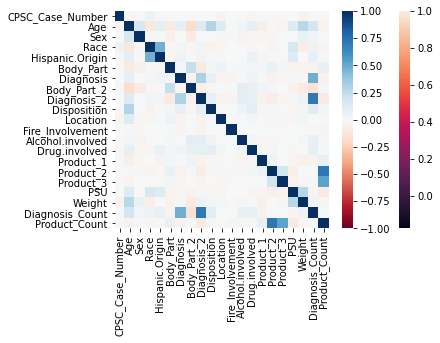

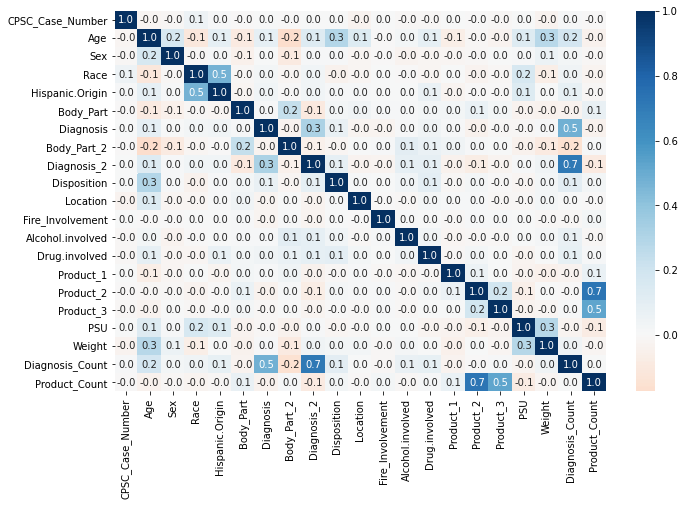

In [21]:
# Correlations

## simple heatmap of correlations (without values) 
corr = df.corr()
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns)

# Change the colormap to a divergent scale and fix the range of the colormap
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, vmin=-1, vmax=1, cmap="RdBu")

# Include information about values (example demonstrate how to control the size of
# the plot
fig, ax = plt.subplots()
fig.set_size_inches(11, 7)
    
sns.heatmap(corr, annot=True, fmt=".1f", cmap="RdBu", center=0, ax=ax)


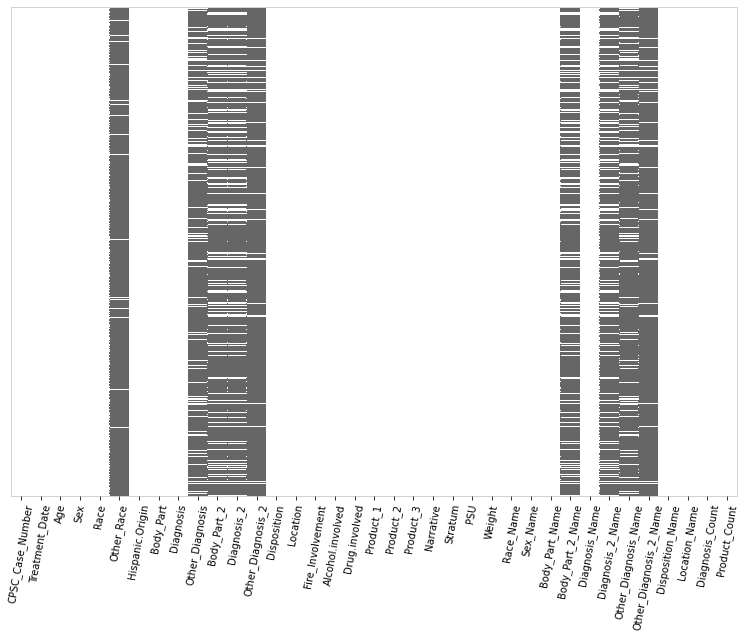

In [22]:
# Missing Values:

# given a dataframe df create a copy of the array that is 0 if a field contains a
# value and 1 for NaN
naInfo = np.zeros(df.shape)
naInfo[df.isna().values] = 1
naInfo = pd.DataFrame(naInfo, columns=df.columns)
fig, ax = plt.subplots()
fig.set_size_inches(13, 9)
ax = sns.heatmap(naInfo, vmin=0, vmax=1, cmap=["white", "#666666"], cbar=False, ax=ax)
ax.set_yticks([])

# draw frame around figure
rect = plt.Rectangle((0, 0), naInfo.shape[1], naInfo.shape[0], linewidth=1, edgecolor="lightgrey", facecolor="none")
rect = ax.add_patch(rect)
rect.set_clip_on(False)
plt.xticks(rotation=80)
plt.show()

#### Dimension Reduction Phase 1
Reviewing the results provided by the initial data visualizations, the following design decisions were made for proceeding with the dataset:
* Other_Race & Hispanic.Origin may be dropped due to missing values and redundancy. 
* PSU and Stratum columns may be dropped due to lack of documentation.  
* CPSC_Case_Number may be dropped due to a lack of relevance to the dataset. 

In order to further reduce the dimensionality of the dataset, more visualizations and aggregations were required to comprehend the dataset. Panda's ProfileReport library was leveraged to gain this perspective on the dataset.

In [23]:
# Dropping aforementioned columns
# KEEPING CPSC col to simplify data wrangling process!
df = df.drop(columns=['Other_Race', 'Hispanic.Origin', 'PSU', 'Stratum', 'CPSC_Case_Number'])

In [24]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/46 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Dimension Reduction Phase 2
From the pandas ProfileReport, a variety of key insights were gathered from the dataset. At a high level, there are 17 Categorical Variables, 12 Numeric Variables, 2 Boolean Variables, and 1 Date Variable. Of the 17 Categorical Variables, 9 were manually created to simplify the data visualization process and will be removed moving forward. 

Extracted Graphs: Body Part Names Frequencies, Missing Values Bar Chart, Pearsons Correlation Matrix

In [25]:
df = df.drop(columns=['Race_Name', 'Sex_Name', 'Body_Part_Name', 'Body_Part_2_Name',
       'Diagnosis_Name', 'Diagnosis_2_Name', 'Other_Diagnosis_Name',
       'Other_Diagnosis_2_Name', 'Disposition_Name', 'Location_Name','Other_Diagnosis','Other_Diagnosis_2','Body_Part_2'])

#ProfileReport(df)

In [26]:
df.columns

Index(['Treatment_Date', 'Age', 'Sex', 'Race', 'Body_Part', 'Diagnosis',
       'Diagnosis_2', 'Disposition', 'Location', 'Fire_Involvement',
       'Alcohol.involved', 'Drug.involved', 'Product_1', 'Product_2',
       'Product_3', 'Narrative', 'Weight', 'Diagnosis_Count', 'Product_Count'],
      dtype='object')

## Descriptive Analysis
* 2 Analytical graphics each --> See Word doc for final submission for March 7th
* Wei's Advice: the more we write now, the less we will have to write later
* SEE Link For NEXT STEPS: https://colab.research.google.com/drive/1m-sghZTdPqtMguXIVJOeHqk-mn16Rg5Q?usp=sharing#scrollTo=UY_0MoKExiJ7 

In [27]:
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df)

Here, we try to scale and transform the numeric features to make them smoother, less skewed, and more appropriate for modeling.

**PowerTransformer** attempts to make the data more like a normal distribution, which should soften the impact of extreme outliers and make the distributions smoother.

**MinMaxScaler** is used as a first step to make sure the numbers are in a reasonable range, as PowerTransformer can fail on very large numbers.

In [14]:
from sklearn.preprocessing import MinMaxScaler, PowerTransformer
from sklearn.pipeline import make_pipeline

pipeline = make_pipeline(MinMaxScaler(), PowerTransformer())
numeric_col_names = ['Age','Body_Len','CreationDate_Epoch','AnswerCount','ViewCount','Score','CommentCount']
train_df_norm = pd.DataFrame(pipeline.fit_transform(train_df[numeric_col_names]), columns=numeric_col_names)
train_df_norm = train_df_norm.combine_first(train_df.reset_index()) # Add the other columns back

KeyError: "None of [Index(['Title_Len', 'Body_Len', 'CreationDate_Epoch', 'AnswerCount',\n       'ViewCount', 'Score', 'CommentCount'],\n      dtype='object')] are in the [columns]"

In [39]:
def threeSum(nums):
    if(len(nums) >= 3):
        unqTrips = []
        nums = sorted(nums)
        for i in range(0,len(nums)-3):
            print(i)
            start = i + 1
            end = len(nums) - 1
            print(start, end)
            while(start < end):
                cumSum = nums[i] + nums[start] + nums[end]
                print(cumSum)
                if (cumSum == 0):
                    zList = sorted([nums[i], nums[start], nums[end]])
                    print(zList)
                    if(zList not in unqTrips):
                        unqTrips.append(zList)
                    start += 1
                elif(cumSum < 0):
                    start += 1
                else:
                    end -= 1
        return unqTrips
    else:
        return []

In [40]:
threeSum(nums = [0,0,0])

[]

In [41]:
len([0,0,0])

3